### 安装配置环境

In [1]:
!pip install numpy pandas matplotlib requests tqdm opencv-python pillow -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [2]:
!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple, https://download.pytorch.org/whl/cu113


In [3]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.10.0/index.html
     |████████████████████████████████| 58.2 MB 8.6 MB/s eta 0:00:011     |███████████████▋                | 28.3 MB 16.2 MB/s eta 0:00:02


#### 下载中文字体文件

In [4]:
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf

--2023-01-26 23:36:21--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 10050868 (9.6M) [application/x-font-ttf]
正在保存至: “SimHei.ttf”

SimHei.ttf          100%[===================>]   9.58M  20.9MB/s    用时 0.5s    

2023-01-26 23:36:22 (20.9 MB/s) - 已保存 “SimHei.ttf” [10050868/10050868])



#### 创建目录

In [5]:
import os

In [10]:
# 存放测试图片
os.mkdir('test_img')

# 存放结果文件
os.mkdir('output')

# 存放训练得到的模型权重
os.mkdir('checkpoints')

In [11]:
# 下载样例模型文件
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/checkpoints/fruit30_pytorch_20220814.pth -P checkpoints

# 下载 类别名称 和 ID索引号 的映射字典
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/fruit30/idx_to_labels.npy

--2023-01-26 23:38:34--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/checkpoints/fruit30_pytorch_20220814.pth
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 44854477 (43M) [binary/octet-stream]
正在保存至: “checkpoints/fruit30_pytorch_20220814.pth”

fruit30_pytorch_202 100%[===================>]  42.78M  41.6MB/s    用时 1.0s    

2023-01-26 23:38:36 (41.6 MB/s) - 已保存 “checkpoints/fruit30_pytorch_20220814.pth” [44854477/44854477])

--2023-01-26 23:38:36--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/fruit30/idx_to_labels.npy
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 769 [binary/octet-stream]
正在保存至: “idx_to_labels.npy.1”

idx_to_labels.npy.1 100%[===================>]     769  --.-KB/s    用时 0s      

2023-01-26 23:38:36 (18.4 MB/s) - 已保存 “idx_to_labels.npy.1” [769/769])



In [12]:
# 下载测试图像文件 至 test_img 文件夹

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_fruits.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_orange_2.jpg -P test_img 

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_bananan.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_kiwi.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_石榴.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_orange.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_lemon.jpg -P test_img

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_火龙果.jpg -P test_img

!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/watermelon1.jpg -P test_img

!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/test/banana1.jpg -P test_img

# 下载测试视频文件 至 test_img 文件夹

!wget https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/fruits_video.mp4 -P test_img 

--2023-01-26 23:38:46--  https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_fruits.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 2579427 (2.5M) [image/jpeg]
正在保存至: “test_img/test_fruits.jpg”

test_fruits.jpg     100%[===================>]   2.46M  7.02MB/s    用时 0.4s    

2023-01-26 23:38:47 (7.02 MB/s) - 已保存 “test_img/test_fruits.jpg” [2579427/2579427])

--2023-01-26 23:38:47--  https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_orange_2.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 1771019 (1.7M) [image/jpeg]
正在保存至: “test_img/test_orange_2.jpg”

test_orange_2.jpg   100%[===================>]   1.69M  5.59MB/s    用时 0.3s    

2023-01-26 23:38:47 (5.59 MB/s) - 已保存 “test_img/test_orange_2.jpg” [1771019/1771019])

--2023-01-26 23:38:47--  https://zihao-openmmlab.obs.myhuaweicloud.com/20220716-mmclassification/test/0818/test_bananan.jpg
正在连接 172.16.0.13:5848... 已连接。
已发出 Prox

#### 设置matplotlib中文字体

In [1]:
# Linux操作系统，例如 云GPU平台：https://featurize.cn/?s=d7ce99f842414bfcaea5662a97581bd1
# 如果报错 Unable to establish SSL connection.，重新运行本代码块即可
!wget https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf -O /environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf --no-check-certificate
!rm -rf /home/featurize/.cache/matplotlib

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rc("font",family='SimHei') # 中文字体
plt.rcParams['axes.unicode_minus']=False  # 用来正常显示负号

--2023-01-26 23:40:32--  https://zihao-openmmlab.obs.cn-east-3.myhuaweicloud.com/20220716-mmclassification/dataset/SimHei.ttf
正在连接 172.16.0.13:5848... 已连接。
已发出 Proxy 请求，正在等待回应... 200 OK
长度： 10050868 (9.6M) [application/x-font-ttf]
正在保存至: “/environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf”

/environment/minico 100%[===================>]   9.58M  22.0MB/s    用时 0.4s    

2023-01-26 23:40:33 (22.0 MB/s) - 已保存 “/environment/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/fonts/ttf/SimHei.ttf” [10050868/10050868])



### 预测新图像

#### 导入工具包

In [3]:
import torch
import torchvision
import torch.nn.functional as F

import numpy as np
import pandas as pd

# 有 GPU 就用 GPU，没有就用 CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [4]:
device

device(type='cuda', index=0)

#### 导入pillow中文字体

In [5]:
from PIL import Image, ImageFont, ImageDraw
# 导入中文字体，指定字号
font = ImageFont.truetype('SimHei.ttf', 32)

#### 载入类别

In [6]:
idx_to_labels = np.load('idx_to_labels.npy', allow_pickle=True).item()

In [7]:
idx_to_labels

{0: '哈密瓜',
 1: '圣女果',
 2: '山竹',
 3: '杨梅',
 4: '柚子',
 5: '柠檬',
 6: '桂圆',
 7: '梨',
 8: '椰子',
 9: '榴莲',
 10: '火龙果',
 11: '猕猴桃',
 12: '石榴',
 13: '砂糖橘',
 14: '胡萝卜',
 15: '脐橙',
 16: '芒果',
 17: '苦瓜',
 18: '苹果-红',
 19: '苹果-青',
 20: '草莓',
 21: '荔枝',
 22: '菠萝',
 23: '葡萄-白',
 24: '葡萄-红',
 25: '西瓜',
 26: '西红柿',
 27: '车厘子',
 28: '香蕉',
 29: '黄瓜'}

#### 导入训练好的模型

In [8]:
model = torch.load('checkpoints/fruit30_pytorch_20220814.pth')
model = model.eval().to(device)

#### 预处理

In [9]:
from torchvision import transforms
# 测试集图像预处理-RCTN：缩放、裁剪、转 Tensor、归一化
test_transform = transforms.Compose([transforms.Resize(256),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(
                                         mean=[0.485, 0.456, 0.406], 
                                         std=[0.229, 0.224, 0.225])
                                    ])

#### 载入一张测试图像

In [10]:
from PIL import Image

In [12]:
# img_path = 'test_img/watermelon1.jpg'
# img_path = 'test_img/banana1.jpg'
# img_path = 'test_img/test_bananan.jpg'
# img_path = 'test_img/test_orange.jpg'
# img_path = 'test_img/test_orange_2.jpg'
img_path = 'test_img/test_kiwi.jpg'
# img_path = 'test_img/test_lemon.jpg'
# img_path = 'test_img/test_石榴.jpg'
# img_path = 'test_img/test_火龙果.jpg'

In [13]:
img_pil = Image.open(img_path)

In [14]:
np.array(img_pil).shape

(2736, 3648, 3)

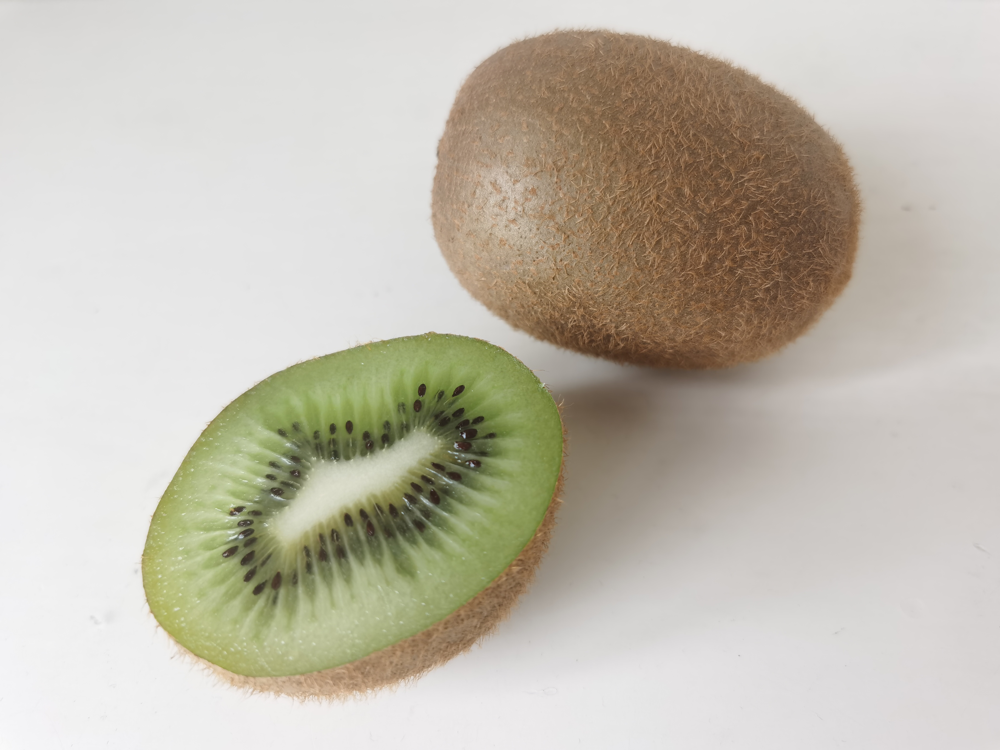

In [15]:
img_pil

#### 预处理、前向预测

In [16]:
input_img = test_transform(img_pil) # 预处理

In [17]:
input_img.shape

torch.Size([3, 224, 224])

In [18]:
input_img = input_img.unsqueeze(0).to(device)

In [19]:
input_img.shape

torch.Size([1, 3, 224, 224])

In [20]:
# 执行前向预测，得到所有类别的 logit 预测分数
pred_logits = model(input_img) 

In [21]:
pred_logits

tensor([[ -3.7158, -10.4678,  -8.7764, -10.4551,  -3.5353,  -8.6391,  -4.8368,
          -2.4056,  -3.1001,  -8.1229, -14.2601,   7.5656, -12.0856,  -7.0518,
          -9.3815,  -8.5863,  -3.0567, -14.7760,  -7.0263,  -5.7984, -10.8762,
          -8.4887, -10.8884, -10.2968, -10.9926, -11.0781,  -7.3640, -11.0257,
          -7.4394, -10.5450]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [22]:
pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算

In [23]:
pred_softmax

tensor([[1.2603e-05, 1.4728e-08, 7.9930e-08, 1.4916e-08, 1.5096e-05, 9.1690e-08,
         4.1081e-06, 4.6721e-05, 2.3329e-05, 1.5363e-07, 3.3202e-10, 9.9987e-01,
         2.9210e-09, 4.4843e-07, 4.3641e-08, 9.6662e-08, 2.4362e-05, 1.9820e-10,
         4.6000e-07, 1.5705e-06, 9.7897e-09, 1.0657e-07, 9.6707e-09, 1.7475e-08,
         8.7142e-09, 7.9997e-09, 3.2817e-07, 8.4298e-09, 3.0433e-07, 1.3633e-08]],
       device='cuda:0', grad_fn=<SoftmaxBackward0>)

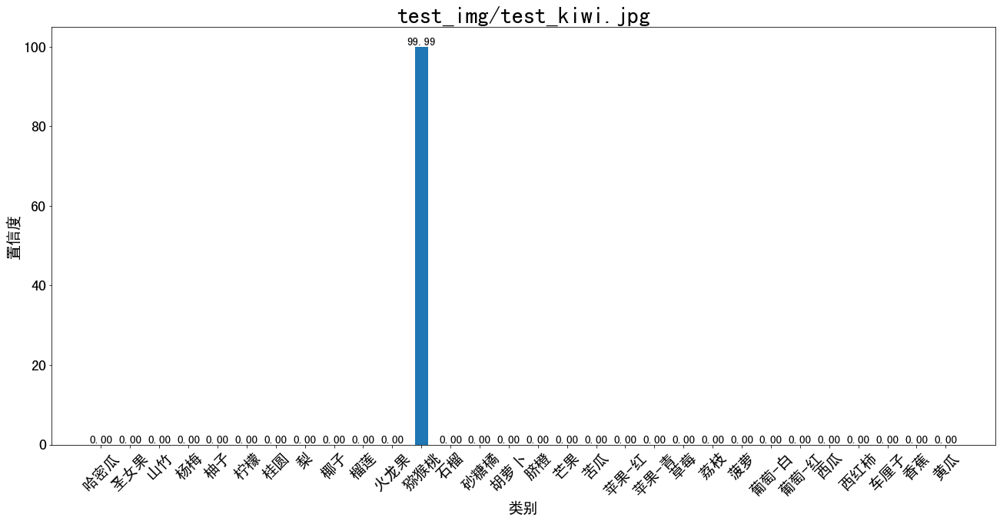

In [24]:
plt.figure(figsize=(22, 10))

x = idx_to_labels.values()
y = pred_softmax.cpu().detach().numpy()[0] * 100
width = 0.45 # 柱状图宽度

ax = plt.bar(x, y, width)

plt.bar_label(ax, fmt='%.2f', fontsize=15) # 置信度数值
plt.tick_params(labelsize=20) # 设置坐标文字大小

plt.title(img_path, fontsize=30)
plt.xticks(rotation=45) # 横轴文字旋转
plt.xlabel('类别', fontsize=20)
plt.ylabel('置信度', fontsize=20)
plt.show()

#### 置信度最大的前 n 个结果

In [25]:
n = 10
top_n = torch.topk(pred_softmax, n) # 取置信度最大的 n 个结果
pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析出类别
confs = top_n[0].cpu().detach().numpy().squeeze() # 解析出置信度

In [26]:
pred_ids

array([11,  7, 16,  8,  4,  0,  6, 19, 18, 13])

In [27]:
confs

array([9.9987006e-01, 4.6721147e-05, 2.4362109e-05, 2.3329259e-05,
       1.5096412e-05, 1.2603436e-05, 4.1080916e-06, 1.5704934e-06,
       4.5999562e-07, 4.4843441e-07], dtype=float32)

#### 图像分类结果写在原图上

In [28]:
draw = ImageDraw.Draw(img_pil)

In [29]:
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]] # 获取类别名称
    confidence = confs[i] * 100 # 获取置信度
    text = '{:<15} {:>.4f}'.format(class_name, confidence)
    print(text)
    
    # 文字坐标，中文字符串，字体，rgba颜色
    draw.text((50, 100 + 50 * i), text, font=font, fill=(255, 0, 0, 1))

猕猴桃             99.9870
梨               0.0047
芒果              0.0024
椰子              0.0023
柚子              0.0015
哈密瓜             0.0013
桂圆              0.0004
苹果-青            0.0002
苹果-红            0.0000
砂糖橘             0.0000


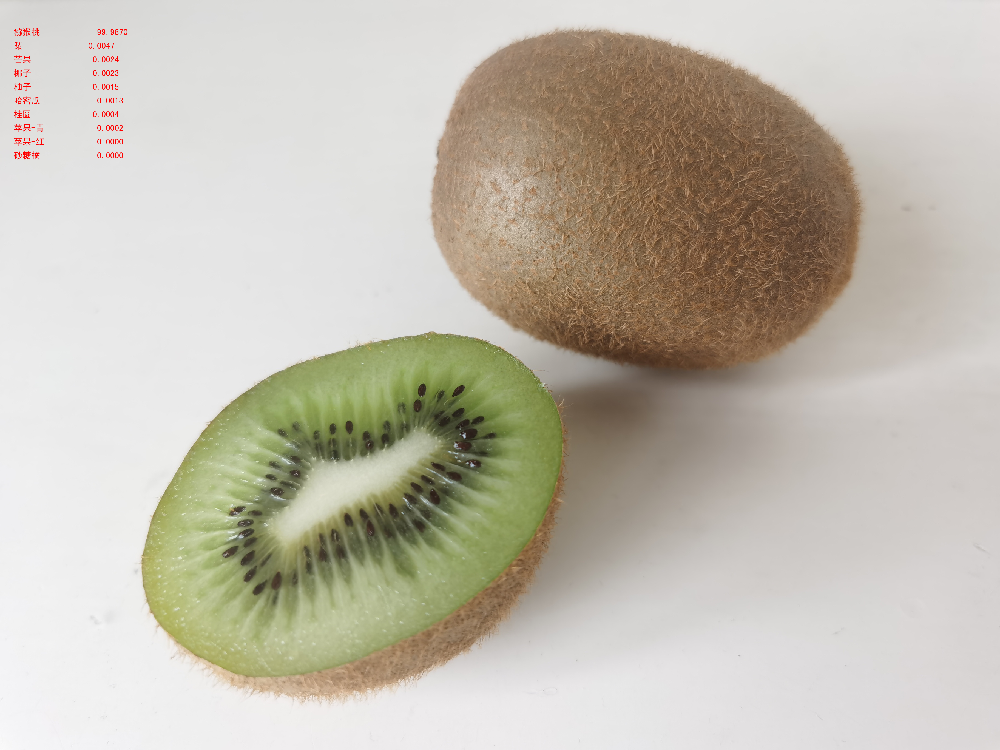

In [30]:
img_pil

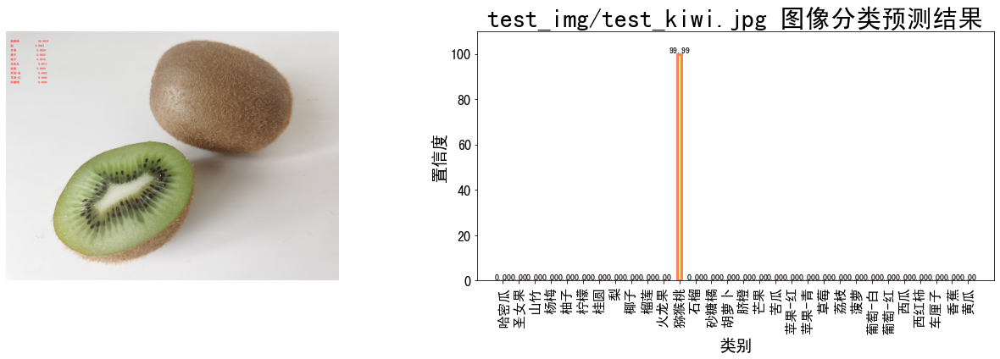

In [31]:
fig = plt.figure(figsize=(18,6))

# 绘制左图-预测图
ax1 = plt.subplot(1,2,1)
ax1.imshow(img_pil)
ax1.axis('off')

# 绘制右图-柱状图
ax2 = plt.subplot(1,2,2)
x = idx_to_labels.values()
y = pred_softmax.cpu().detach().numpy()[0] * 100
ax2.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
plt.bar_label(ax, fmt='%.2f', fontsize=10) # 置信度数值

plt.title('{} 图像分类预测结果'.format(img_path), fontsize=30)
plt.xlabel('类别', fontsize=20)
plt.ylabel('置信度', fontsize=20)
plt.ylim([0, 110]) # y轴取值范围
ax2.tick_params(labelsize=16) # 坐标文字大小
plt.xticks(rotation=90) # 横轴文字旋转

plt.tight_layout()
fig.savefig('output/预测图+柱状图.jpg')

#### 预测结果表格输出

In [32]:
pred_df = pd.DataFrame() # 预测结果表格
for i in range(n):
    class_name = idx_to_labels[pred_ids[i]] # 获取类别名称
    label_idx = int(pred_ids[i]) # 获取类别号
    confidence = confs[i] * 100 # 获取置信度
    pred_df = pred_df.append({'Class':class_name, 'Class_ID':label_idx, 'Confidence(%)':confidence}, ignore_index=True) # 预测结果表格添加一行
display(pred_df) # 展示预测结果表格

,Class,Class_ID,Confidence(%)
0,猕猴桃,11.0,99.987006
1,梨,7.0,0.004672
2,芒果,16.0,0.002436
3,椰子,8.0,0.002333
4,柚子,4.0,0.001510
5,哈密瓜,0.0,0.001260
6,桂圆,6.0,0.000411
7,苹果-青,19.0,0.000157
8,苹果-红,18.0,0.000046
9,砂糖橘,13.0,0.000045


### 预测视频文件

In [35]:
import os
import time
import shutil
import tempfile
from tqdm import tqdm

import cv2
from PIL import Image

import numpy as np
import pandas as pd
import matplotlib
matplotlib.rc("font",family='SimHei') # 中文字体
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['axes.unicode_minus']=False  # 用来正常显示负号
plt.rcParams['font.sans-serif']=['SimHei']  # 用来正常显示中文标签
import gc

import torch
import torch.nn.functional as F
from torchvision import models

import mmcv

# 有 GPU 就用 GPU，没有就用 CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device:', device)

device: cuda:0


/environment/miniconda3/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


#### 视频预测

In [36]:
input_video = 'test_img/fruits_video.mp4'

#### 图像分类预测函数

In [40]:
def pred_single_frame(img, n=5):
    '''
    输入摄像头画面bgr-array，输出前n个图像分类预测结果的图像bgr-array
    '''
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    img_pil = Image.fromarray(img_rgb) # array 转 pil
    input_img = test_transform(img_pil).unsqueeze(0).to(device) # 预处理
    pred_logits = model(input_img) # 执行前向预测，得到所有类别的 logit 预测分数
    pred_softmax = F.softmax(pred_logits, dim=1) # 对 logit 分数做 softmax 运算
    
    top_n = torch.topk(pred_softmax, n) # 取置信度最大的 n 个结果
    pred_ids = top_n[1].cpu().detach().numpy().squeeze() # 解析出类别
    confs = top_n[0].cpu().detach().numpy().squeeze() # 解析出置信度
    
    # 在图像上写字
    draw = ImageDraw.Draw(img_pil)
    # 在图像上写字
    for i in range(len(confs)):
        pred_class = idx_to_labels[pred_ids[i]]
        text = '{:<15} {:>.3f}'.format(pred_class, confs[i])
        # 文字坐标，中文字符串，字体，rgba颜色
        draw.text((50, 100 + 50 * i), text, font=font, fill=(255, 0, 0, 1))
        
    img_bgr = cv2.cvtColor(np.array(img_pil), cv2.COLOR_RGB2BGR) # RGB转BGR
        
    return img_bgr, pred_softmax

#### 可视化方案一：原始图像+预测结果文字

In [37]:
# 创建临时文件夹，存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('创建临时文件夹 {} 用于存放每帧预测结果'.format(temp_out_dir))

创建临时文件夹 20230126234922 用于存放每帧预测结果


In [41]:
# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):
    
    ## 处理单帧画面
    img, pred_softmax = pred_single_frame(img, n=5)

    # 将处理后的该帧画面图像文件，保存至 /tmp 目录下
    cv2.imwrite(f'{temp_out_dir}/{frame_id:06d}.jpg', img)
    
    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, 'output/output_pred.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 211/211, 25.6 task/s, elapsed: 8s, ETA:     0s[                                                  ] 0/211, elapsed: 0s, ETA:
删除临时文件夹 20230126234922


#### 可视化方案二：原始图像+预测结果文字+各类别置信度柱状图

In [42]:
def pred_single_frame_bar(img):
    '''
    输入pred_single_frame函数输出的bgr-array，加柱状图，保存
    '''
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR 转 RGB
    fig = plt.figure(figsize=(18,6))
    # 绘制左图-视频图
    ax1 = plt.subplot(1,2,1)
    ax1.imshow(img)
    ax1.axis('off')
    # 绘制右图-柱状图
    ax2 = plt.subplot(1,2,2)
    x = idx_to_labels.values()
    y = pred_softmax.cpu().detach().numpy()[0] * 100
    ax2.bar(x, y, alpha=0.5, width=0.3, color='yellow', edgecolor='red', lw=3)
    plt.xlabel('类别', fontsize=20)
    plt.ylabel('置信度', fontsize=20)
    ax2.tick_params(labelsize=16) # 坐标文字大小
    plt.ylim([0, 100]) # y轴取值范围
    plt.xlabel('类别',fontsize=25)
    plt.ylabel('置信度',fontsize=25)
    plt.title('图像分类预测结果', fontsize=30)
    plt.xticks(rotation=90) # 横轴文字旋转
    
    plt.tight_layout()
    fig.savefig(f'{temp_out_dir}/{frame_id:06d}.jpg')
    # 释放内存
    fig.clf()
    plt.close()
    gc.collect()

In [43]:
# 创建临时文件夹，存放每帧结果
temp_out_dir = time.strftime('%Y%m%d%H%M%S')
os.mkdir(temp_out_dir)
print('创建临时文件夹 {} 用于存放每帧预测结果'.format(temp_out_dir))

创建临时文件夹 20230126235050 用于存放每帧预测结果


In [44]:
# 读入待预测视频
imgs = mmcv.VideoReader(input_video)

prog_bar = mmcv.ProgressBar(len(imgs))

# 对视频逐帧处理
for frame_id, img in enumerate(imgs):
    
    ## 处理单帧画面
    img, pred_softmax = pred_single_frame(img, n=5)
    img = pred_single_frame_bar(img)
    
    prog_bar.update() # 更新进度条

# 把每一帧串成视频文件
mmcv.frames2video(temp_out_dir, 'output/output_bar.mp4', fps=imgs.fps, fourcc='mp4v')

shutil.rmtree(temp_out_dir) # 删除存放每帧画面的临时文件夹
print('删除临时文件夹', temp_out_dir)

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 211/211, 101.9 task/s, elapsed: 2s, ETA:     0s[                                                  ] 0/211, elapsed: 0s, ETA:
删除临时文件夹 20230126235050
